In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
df=pd.read_csv("/content/twitter_racism_parsed_dataset.csv")

In [3]:
df.head()

,index,id,Text,Annotation,oh_label
0,5.767493e+17,5.767493e+17,@AAlwuhaib1977 Muslim mob violence against Hin...,racism,1
1,5.408905e+17,5.408905e+17,@Te4m_NiGhtM4Re http://t.co/5Ih7MkDbQG,none,0
2,5.678433e+17,5.678433e+17,@jncatron @isra_jourisra @AMPalestine Islamoph...,racism,1
3,5.766462e+17,5.766462e+17,"Finally I'm all caught up, and that sudden dea...",none,0
4,5.713492e+17,5.713492e+17,@carolinesinders @herecomesfran *hugs*,none,0


In [4]:
df.shape

(13471, 5)

In [5]:
df.isnull().sum()

index         0
id            0
Text          0
Annotation    0
oh_label      0
dtype: int64

In [6]:
df=df.dropna()

In [7]:
import re
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
corpus=[]
for i in range(0,13471):
    review=re.sub('[^a-zA-Z]',' ',df['Text'][i])
    review=review.lower()
    review=review.split()
    ps=PorterStemmer()
    all_stopwords=stopwords.words('english')
    all_stopwords.remove('not')
    review=[ ps.stem(word) for word in review if not word in set(all_stopwords)]
    review=" ".join(review)
    corpus.append(review)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [8]:
print(corpus)

['aalwuhaib muslim mob violenc hindu bangladesh continu islam http co c jbwjwurc', 'te nightm http co ih mkdbqg', 'jncatron isra jourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw', 'final caught sudden death cook look like gonna intens mkr', 'carolinesind herecomesfran hug', 'pleas pleas start use discern blunt steroid mean drug dead', 'aymannathem soon isi chase minor mosul sunni arab happi steal properti fuck', 'ali gharib maxblumenth glad like http co nrk xz', 'huffpostrelig islam invad conquer christiandom christian crusad respons writer liar', 'semzyxx approv pedophil prophet rape year old girl like say hadith', 'watan geeki zekey problem vile muslim tri ration amp excus crime islam rather get rid', 'skawtnyc athenahollow twoscoot tend talk much p person info', 'dylanw cool next time woman talk approach classist might want not complet dismiss', 'rt hadi eli erdogan egyptian nightmar rememb erdogan said turkey egypt egypt turkey http co yakik pjy

In [9]:
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer(max_features=1500)
X=cv.fit_transform(corpus).toarray()
y=df.iloc[:,-1].values

In [10]:
print(X)
print(y)

[[1 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[1 0 1 ... 0 0 0]


In [11]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [12]:
from sklearn.naive_bayes import GaussianNB
classifier = GaussianNB()
GN_model=classifier.fit(X_train, y_train)

In [13]:
y_pred = classifier.predict(X_test)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[0 0]
 [1 1]
 [0 0]
 ...
 [1 0]
 [1 0]
 [0 0]]
[[1385  918]
 [  44  348]]


0.6430426716141002

In [14]:
from sklearn.svm import SVC
classifier1 = SVC(kernel = 'rbf', random_state = 0)
SC_model=classifier1.fit(X_train, y_train)

In [15]:
y_pred = classifier1.predict(X_test)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))

[[0 0]
 [0 1]
 [0 0]
 ...
 [0 0]
 [0 0]
 [0 0]]


In [16]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[2233   70]
 [ 126  266]]


0.9272727272727272

In [17]:
from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier(criterion = 'entropy', random_state = 0)
DT_model=classifier.fit(X_train, y_train)

In [18]:
y_pred = classifier.predict(X_test)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))

[[0 0]
 [0 1]
 [0 0]
 ...
 [0 0]
 [0 0]
 [0 0]]


In [19]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[2183  120]
 [ 147  245]]


0.9009276437847866

In [20]:
import matplotlib.pyplot as plt
from sklearn import tree
import sys
sys.setrecursionlimit(10000)
plt.figure(figsize=(200,190))
tree.plot_tree(classifier, filled=True)

[Text(0.9464594910714197, 0.9954128440366973, 'x[683] <= 0.5\nentropy = 0.601\nsamples = 10776\nvalue = [9198, 1578]'),
 Text(0.9152495751984265, 0.9862385321100917, 'x[884] <= 0.5\nentropy = 0.486\nsamples = 9997\nvalue = [8944, 1053]'),
 Text(0.8915874394454705, 0.9770642201834863, 'x[857] <= 0.5\nentropy = 0.372\nsamples = 9505\nvalue = [8823, 682]'),
 Text(0.8745506389804699, 0.9678899082568807, 'x[862] <= 0.5\nentropy = 0.491\nsamples = 6339\nvalue = [5661, 678]'),
 Text(0.8548507531207317, 0.9587155963302753, 'x[883] <= 0.5\nentropy = 0.443\nsamples = 6214\nvalue = [5643, 571]'),
 Text(0.8390649418738302, 0.9495412844036697, 'x[1060] <= 0.5\nentropy = 0.415\nsamples = 6122\nvalue = [5609, 513]'),
 Text(0.8239204223174704, 0.9403669724770642, 'x[1039] <= 0.5\nentropy = 0.39\nsamples = 6023\nvalue = [5562, 461]'),
 Text(0.8080050982750139, 0.9311926605504587, 'x[821] <= 0.5\nentropy = 0.372\nsamples = 5981\nvalue = [5553, 428]'),
 Text(0.7926015531275442, 0.9220183486238532, 'x[109

In [21]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)
rf_model=classifier.fit(X_train, y_train)

In [22]:
y_pred = classifier.predict(X_test)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))

[[0 0]
 [0 1]
 [0 0]
 ...
 [0 0]
 [0 0]
 [0 0]]


In [23]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[2226   77]
 [ 152  240]]


0.9150278293135437

In [24]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
feature_names=None
plt.figure(figsize=(250,240))
plot_tree(classifier.estimators_[0],
          feature_names=feature_names,
          class_names='class',
          filled=True, impurity=True,
          rounded=True)
plt.show()

In [25]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors=5,algorithm='kd_tree',leaf_size=30,metric="minkowski")
KNN_model=classifier.fit(X_train, y_train)

In [26]:
y_pred = classifier.predict(X_test)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))

[[0 0]
 [0 1]
 [0 0]
 ...
 [0 0]
 [0 0]
 [0 0]]


In [27]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[2290   13]
 [ 349   43]]


0.8656771799628943

In [28]:
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(random_state=0)
log_model=classifier.fit(X_train, y_train)

In [29]:
y_pred = classifier.predict(X_test)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))

[[0 0]
 [1 1]
 [0 0]
 ...
 [0 0]
 [0 0]
 [0 0]]


In [30]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[2227   76]
 [ 126  266]]


0.9250463821892393

<ipython-input-31-ff13a287dbe0>:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append(result)


              precision    recall  f1-score   support

           0       0.87      0.99      0.93      2303
           1       0.77      0.11      0.19       392

    accuracy                           0.87      2695
   macro avg       0.82      0.55      0.56      2695
weighted avg       0.85      0.87      0.82      2695



<ipython-input-31-ff13a287dbe0>:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append(result)


              precision    recall  f1-score   support

           0       0.94      0.97      0.95      2303
           1       0.76      0.61      0.68       392

    accuracy                           0.92      2695
   macro avg       0.85      0.79      0.81      2695
weighted avg       0.91      0.92      0.91      2695



<ipython-input-31-ff13a287dbe0>:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append(result)


              precision    recall  f1-score   support

           0       0.97      0.60      0.74      2303
           1       0.27      0.89      0.42       392

    accuracy                           0.64      2695
   macro avg       0.62      0.74      0.58      2695
weighted avg       0.87      0.64      0.70      2695



<ipython-input-31-ff13a287dbe0>:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append(result)


              precision    recall  f1-score   support

           0       0.94      0.95      0.94      2303
           1       0.67      0.62      0.65       392

    accuracy                           0.90      2695
   macro avg       0.80      0.79      0.79      2695
weighted avg       0.90      0.90      0.90      2695



<ipython-input-31-ff13a287dbe0>:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append(result)


              precision    recall  f1-score   support

           0       0.95      0.97      0.96      2303
           1       0.79      0.68      0.73       392

    accuracy                           0.93      2695
   macro avg       0.87      0.82      0.84      2695
weighted avg       0.92      0.93      0.92      2695



<ipython-input-31-ff13a287dbe0>:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append(result)
<ipython-input-31-ff13a287dbe0>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sea.barplot(x= 'Accuracy', y = 'Models', data=results, palette="colorblind")


              precision    recall  f1-score   support

           0       0.95      0.97      0.96      2303
           1       0.78      0.68      0.72       392

    accuracy                           0.93      2695
   macro avg       0.86      0.82      0.84      2695
weighted avg       0.92      0.93      0.92      2695

                   Models   Accuracy
0    KNeighborsClassifier  85.529120
0  RandomForestClassifier  90.129561
0              GaussianNB  75.064298
0  DecisionTreeClassifier  89.719537
0                     SVC  91.353986
0      LogisticRegression  91.019827


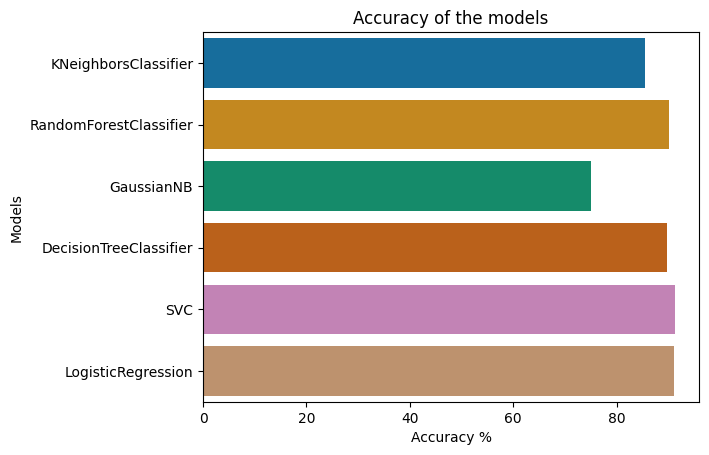

In [31]:
import seaborn as sea
from sklearn.model_selection import cross_val_score,GridSearchCV
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import classification_report
models = [KNN_model,rf_model,GN_model,DT_model,SC_model,log_model]

result = []
results = pd.DataFrame(columns= ["Models","Accuracy"])

for model in models:
    names = model.__class__.__name__
    y_pred = model.predict(X_test)
    accuracy = cross_val_score(model,X_test,y_test,cv=10,scoring="accuracy").mean()
    result = pd.DataFrame([[names, accuracy*100]], columns= ["Models","Accuracy"])
    results = results.append(result)
    print(classification_report(y_test, y_pred))

sea.barplot(x= 'Accuracy', y = 'Models', data=results, palette="colorblind")
plt.xlabel('Accuracy %')
plt.title('Accuracy of the models')
print(results)